In [ ]:
library(ArchR)
library(org.Ss.eg.db)
library(SuscrofaTxdb.11.108.july)
library(patchwork)
library(dplyr)
library(tidyr)
library(RColorBrewer)
library(scales)
library(viridis)
library(AnnotationHub)
library(gprofiler2)
library(Seurat)
library(cowplot)

In [2]:
options(repr.plot.width = 18, repr.plot.height = 17, repr.plot.pointsize = 24)

In [3]:
custom_colors <- list()

colors_dutch <- c(
  '#FFC312','#C4E538','#12CBC4','#FDA7DF','#ED4C67',
  '#F79F1F','#A3CB38','#1289A7','#D980FA','#B53471',
  '#EE5A24','#009432','#0652DD','#9980FA','#833471',
  '#EA2027','#006266','#1B1464','#5758BB','#6F1E51'
)

colors_spanish <- c(
  '#40407a','#706fd3','#f7f1e3','#34ace0','#33d9b2',
  '#2c2c54','#474787','#aaa69d','#227093','#218c74',
  '#ff5252','#ff793f','#d1ccc0','#ffb142','#ffda79',
  '#b33939','#cd6133','#84817a','#cc8e35','#ccae62'
)

custom_colors$discrete <- c(colors_dutch, colors_spanish)

custom_colors$cell_cycle <- setNames(
  c('#45aaf2', '#f1c40f', '#e74c3c', '#7f8c8d'),
  c('G1',      'S',       'G2M',     '-')
)

In [4]:
load(file = "/home/adufour/work/rds_storage/omics/archr_all_v7_stemcells.RData")

In [5]:
archrproj <- archrproj_sub

In [6]:
GImat <- getMatrixFromProject(archrproj_sub, useMatrix="GeneExpressionMatrix")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-83791e9240fd-Date-2024-07-03_Time-14-09-27.log
If there is an issue, please report to github with logFile!

2024-07-03 14:12:26 : Organizing colData, 2.987 mins elapsed.

2024-07-03 14:12:26 : Organizing rowData, 2.991 mins elapsed.

2024-07-03 14:12:26 : Organizing rowRanges, 2.991 mins elapsed.

2024-07-03 14:12:26 : Organizing Assays (1 of 1), 2.991 mins elapsed.

2024-07-03 14:12:29 : Constructing SummarizedExperiment, 3.036 mins elapsed.

2024-07-03 14:12:30 : Finished Matrix Creation, 3.055 mins elapsed.



In [7]:
p4 <- plotEmbedding(archrproj, name = "Clusters", embedding = "UMAP_Harmony", size = 2.5, labelAsFactors=F, labelMeans=F)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-83794578863b-Date-2024-07-03_Time-14-12-30.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-83794578863b-Date-2024-07-03_Time-14-12-30.log



In [8]:
s.genes <- gorth(query = cc.genes$s.genes, source_organism = "hsapiens",
target_organism = "sscrofa", numeric_ns = "ENTREZGENE_ACC")$ortholog_name

In [9]:
g2m.genes <- gorth(query = cc.genes$g2m.genes, source_organism = "hsapiens",
target_organism = "sscrofa", numeric_ns = "ENTREZGENE_ACC")$ortholog_name

In [10]:
matrix <- GImat@assays@data@listData$GeneExpressionMatrix

In [11]:
rownames(matrix) <- GImat@elementMetadata$name

In [12]:
seurat_matrix <- CreateSeuratObject(counts = matrix)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [13]:
seurat_matrix <- CellCycleScoring(seurat_matrix, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

Warning message:
“The following features are not present in the object: PCNA, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: TMPO, GTSE1, not searching for symbol synonyms”


In [14]:
archrproj_sub$Phase <- seurat_matrix@meta.data[rownames(getCellColData(archrproj_sub)),]$Phase

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8379264ef463-Date-2024-07-03_Time-14-12-49.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8379264ef463-Date-2024-07-03_Time-14-12-49.log



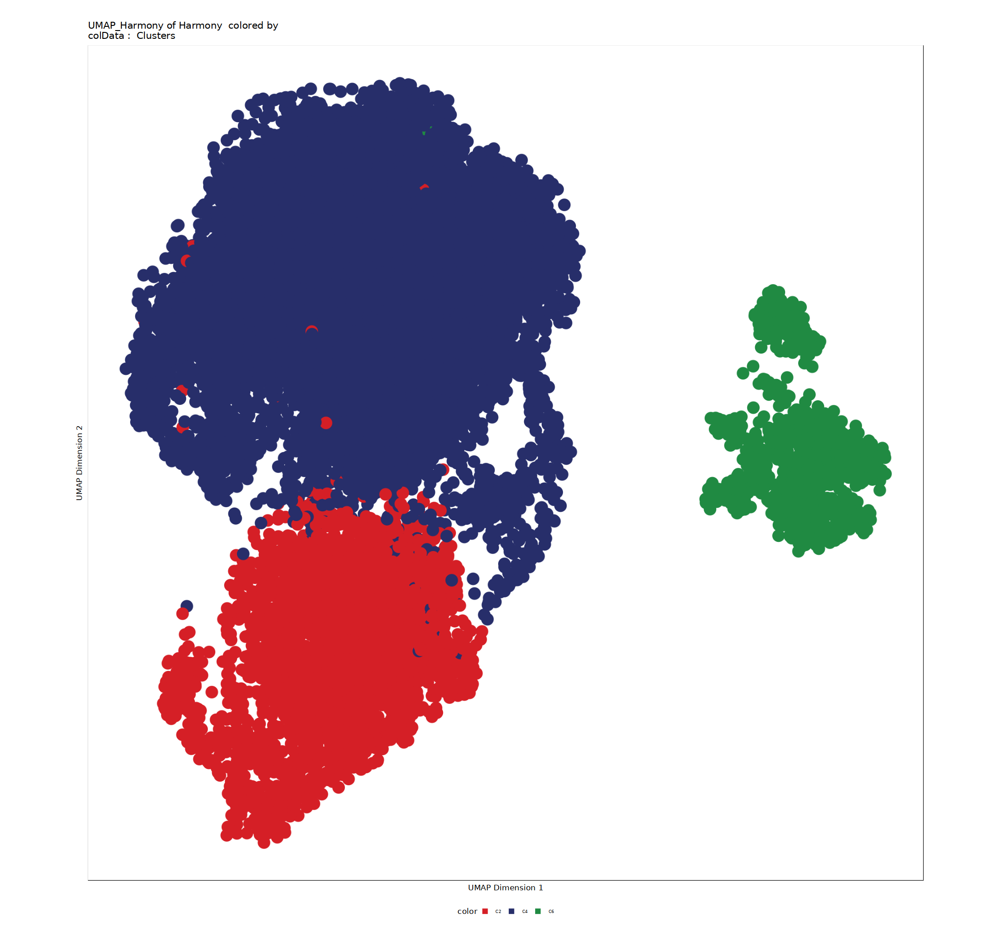

In [15]:
plot_cluster <- plotEmbedding(archrproj_sub, name = "Clusters", embedding = "UMAP_Harmony", size = 2.5, labelAsFactors=F, labelMeans=F)
plot_cluster

In [16]:
plot_cluster$data$color <- as.character(plot_cluster$data$color)

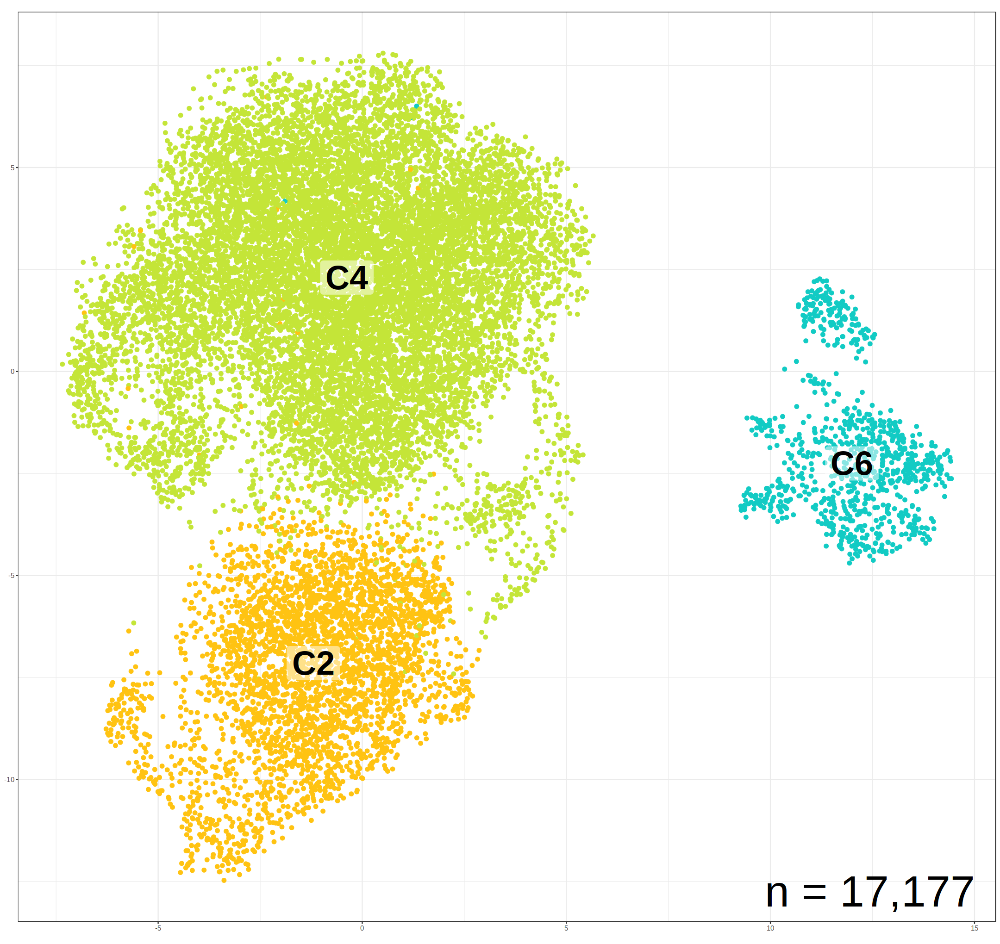

In [17]:
UMAP_centers_cell_type <- tibble(
    UMAP_1 = plot_cluster$data$x,
    UMAP_2 = plot_cluster$data$y,
    seurat_clusters = plot_cluster$data$color
  ) %>%
  group_by(seurat_clusters) %>%
  summarize(x = median(UMAP_1), y = median(UMAP_2))

ggplot_cluster <- plot_cluster$data %>%
  ggplot(aes(x, y, color = color)) +
  geom_point(size = 2) +
  geom_label(
    data = UMAP_centers_cell_type,
    mapping = aes(x, y, label = seurat_clusters),
    size = 15,
    fill = 'white',
    color = 'black',
    fontface = 'bold',
    alpha = 0.5,
    label.size = 0,
    show.legend = FALSE
  ) +
  theme_bw() +
  #expand_limits(x = c(-10,7), y = c(-10,7)) +
  scale_color_manual(values = custom_colors$discrete) +
  theme(axis.title.x = element_blank(),
        axis.title.y = element_blank(),
        legend.position = 'none') +
  coord_fixed() +
  annotate(
    geom = 'text', x = +Inf, y = -Inf,
    label = paste0('n = ', format(nrow(p4$data), big.mark = ',', trim = TRUE)),
    vjust = -.5, hjust = 1.1, 
    color = 'black', size = 20
  )

ggplot_cluster

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-83791244225f-Date-2024-07-03_Time-14-12-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-83791244225f-Date-2024-07-03_Time-14-12-55.log



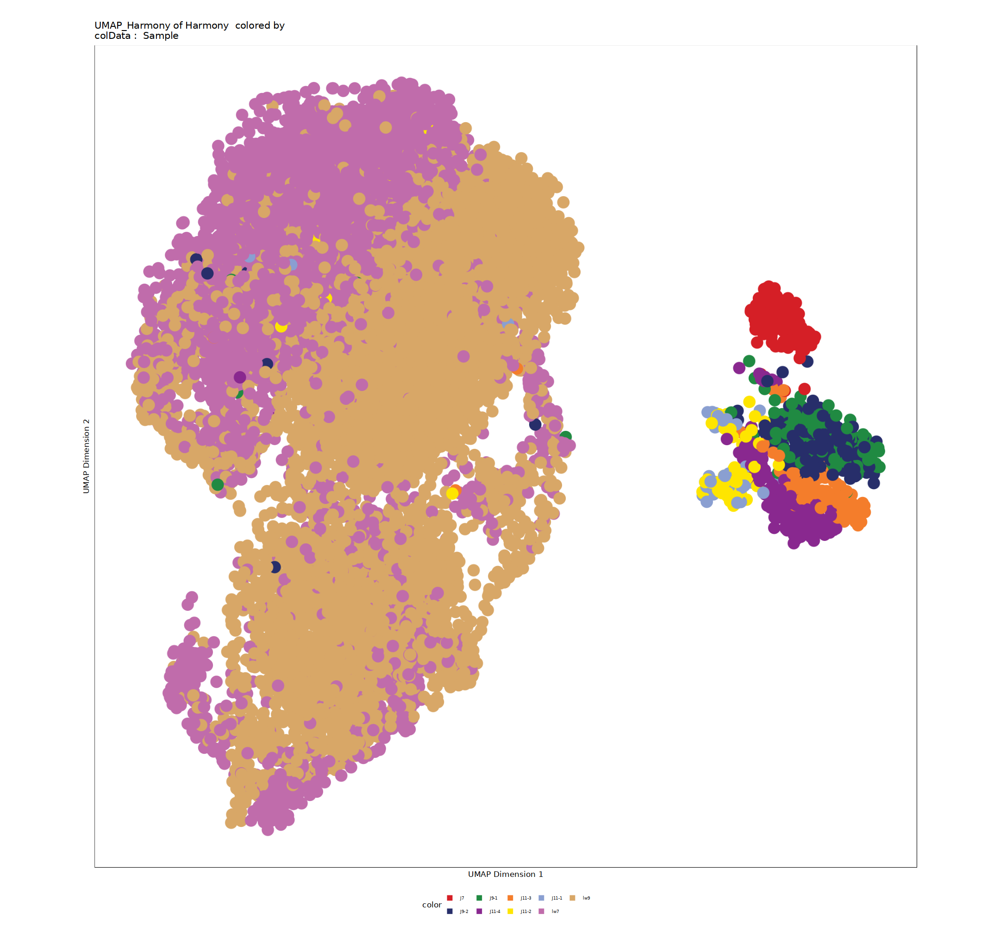

In [18]:
#archrproj <- addClusters(archrproj, reducedDims = "Harmony", name = "Clusters", resolution = 0.1, force = TRUE)
p1 <- plotEmbedding(archrproj, name = "Sample", embedding = "UMAP_Harmony", size = 2.5, labelAsFactors=F, labelMeans=F)
p1

In [19]:
p1$data$color <- as.character(p1$data$color)

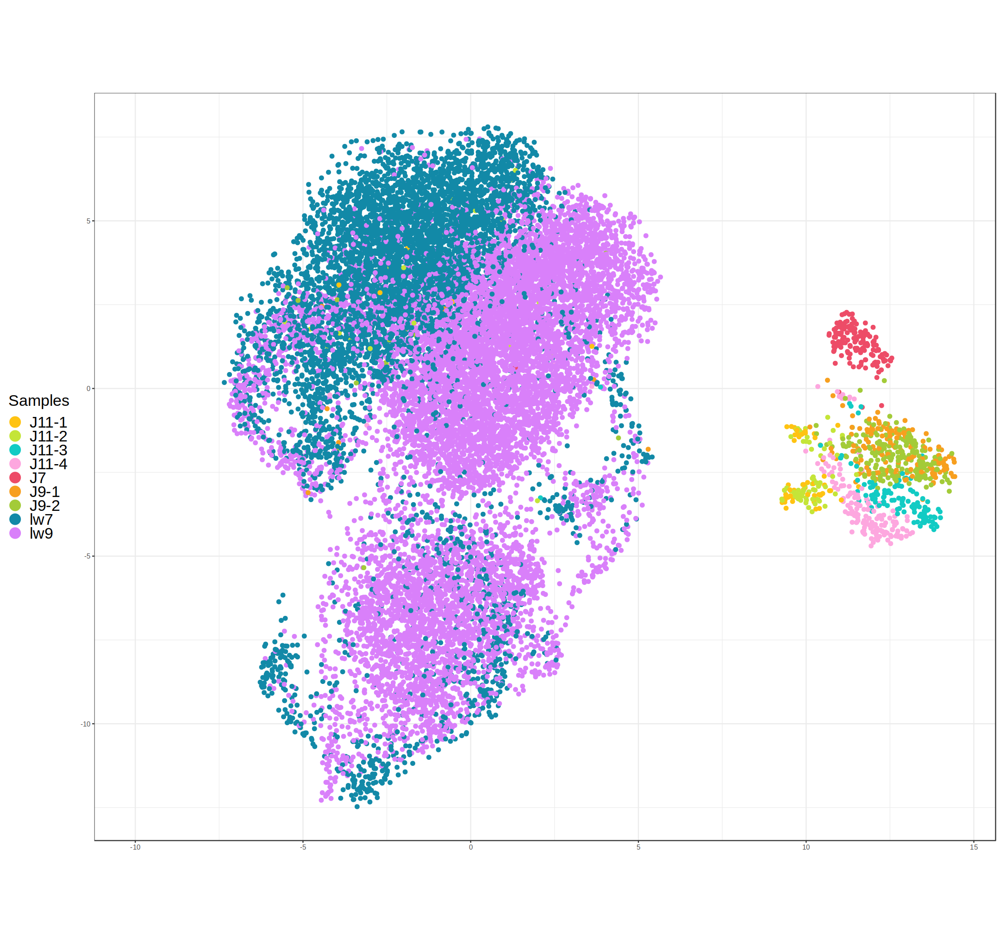

In [20]:
plot_sample <- p1$data %>%
  ggplot(aes(x, y, color = color)) +
  geom_point(size = 2) +
  theme_bw() +
  expand_limits(x = c(-10,7), y = c(-10,7)) +
  scale_color_manual(values = custom_colors$discrete,
                    guide = guide_legend(ncol = 1, override.aes = list(size = 6))) +
  labs(color = 'Samples') +
  theme(legend.position = 'left',
        axis.title.x = element_blank(),
        axis.title.y = element_blank(),
        legend.title = element_text(size = 20),
        legend.text = element_text(size = 20)) +
  coord_fixed()

plot_sample

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-83793f443caa-Date-2024-07-03_Time-14-13-01.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-83793f443caa-Date-2024-07-03_Time-14-13-01.log



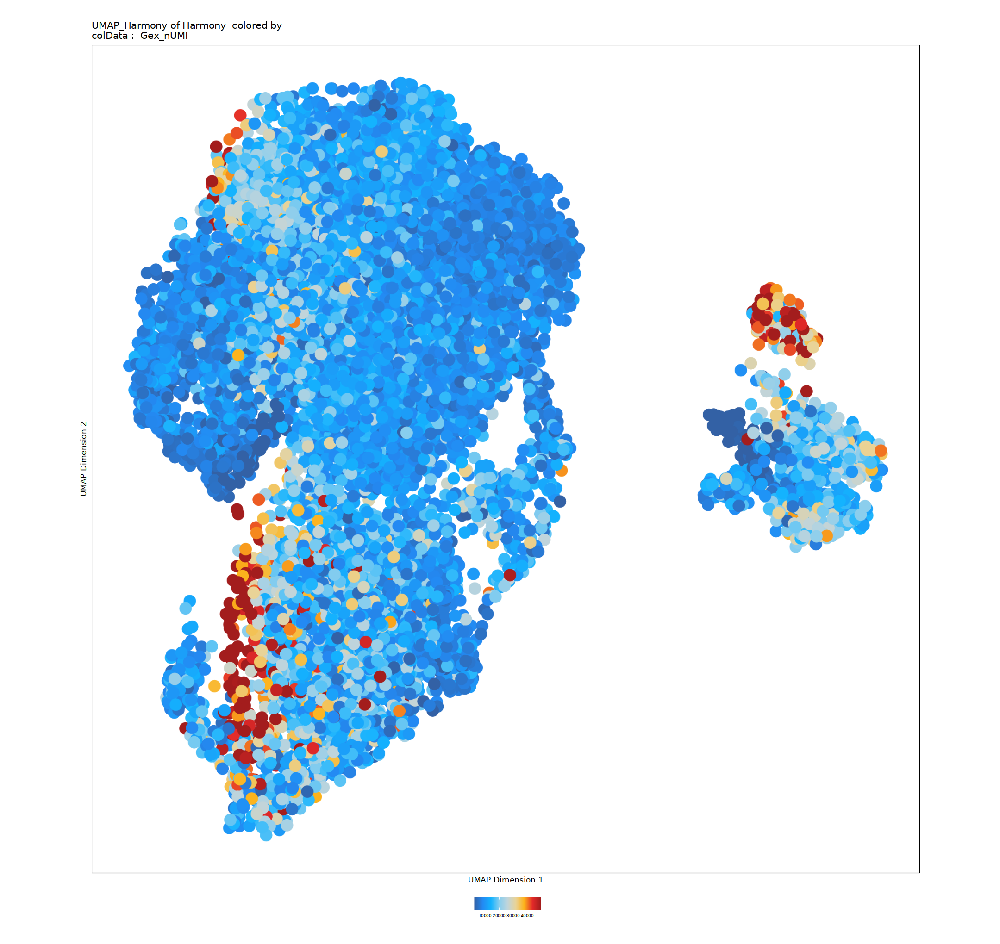

In [21]:
p2 <- plotEmbedding(archrproj, name = "Gex_nUMI", embedding = "UMAP_Harmony", size = 2.5, labelAsFactors=F, plotAs = "points", labelMeans=F)
p2

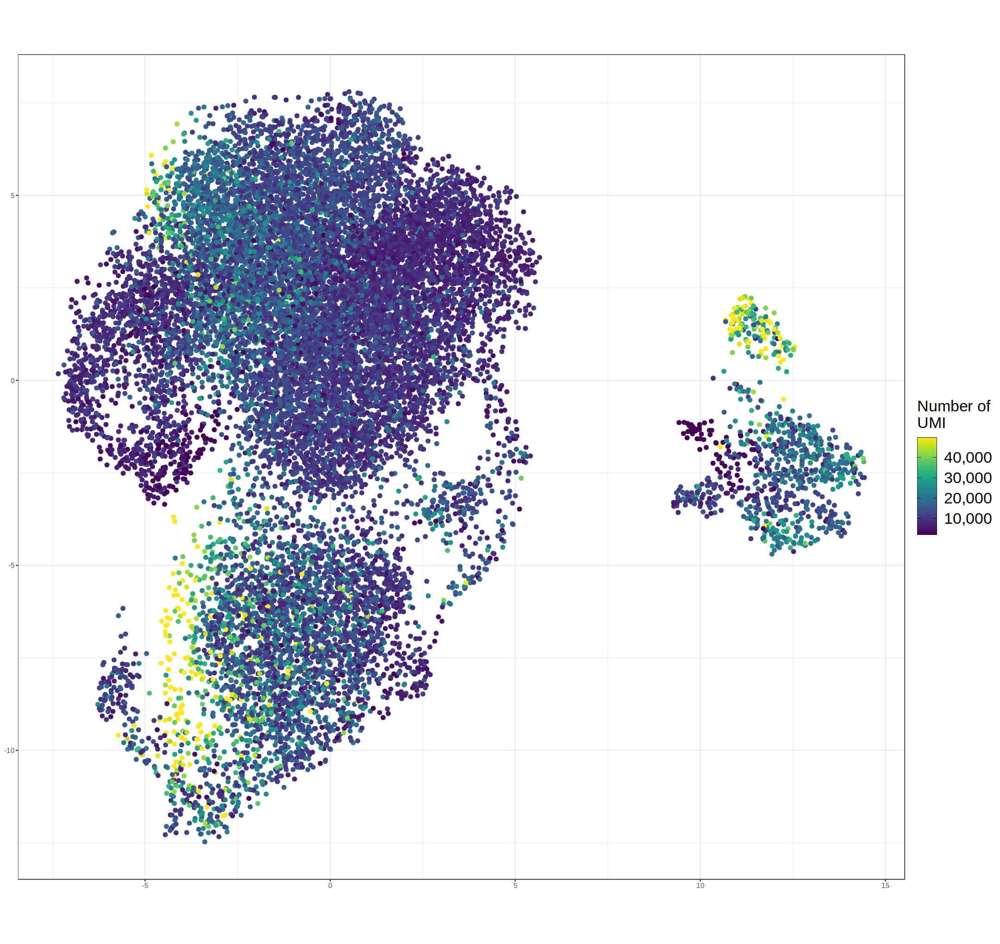

In [22]:
plot_umi <- p2$data %>%
  ggplot(aes(x, y, color = color)) +
  geom_point(size = 2) +
  scale_color_viridis(
    guide = guide_colorbar(frame.colour = 'black', ticks.colour = 'black'),
    labels = scales::comma,
  ) +
  theme_bw() +
  labs(color = 'Number of\nUMI') +
  theme(legend.position = 'right',
        axis.title.x = element_blank(),
        axis.title.y = element_blank(),
        legend.title = element_text(size = 20),
        legend.text = element_text(size = 20),
        legend.key.size = unit(0.35, "inches")) +
  coord_fixed()

plot_umi

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-83791d7f6432-Date-2024-07-03_Time-14-13-06.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-83791d7f6432-Date-2024-07-03_Time-14-13-06.log



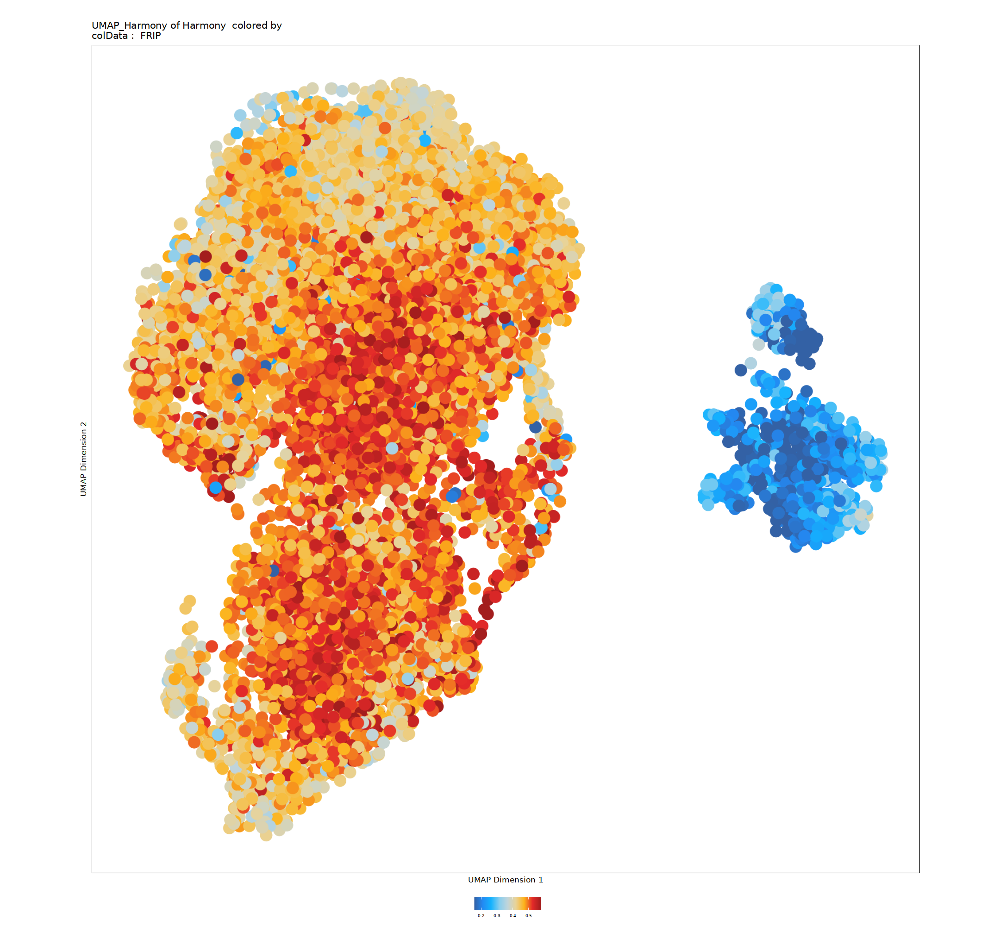

In [23]:
p3 <- plotEmbedding(archrproj, name = "FRIP", embedding = "UMAP_Harmony", size = 2.5, labelAsFactors=F, plotAs = "points", labelMeans=F)
p3

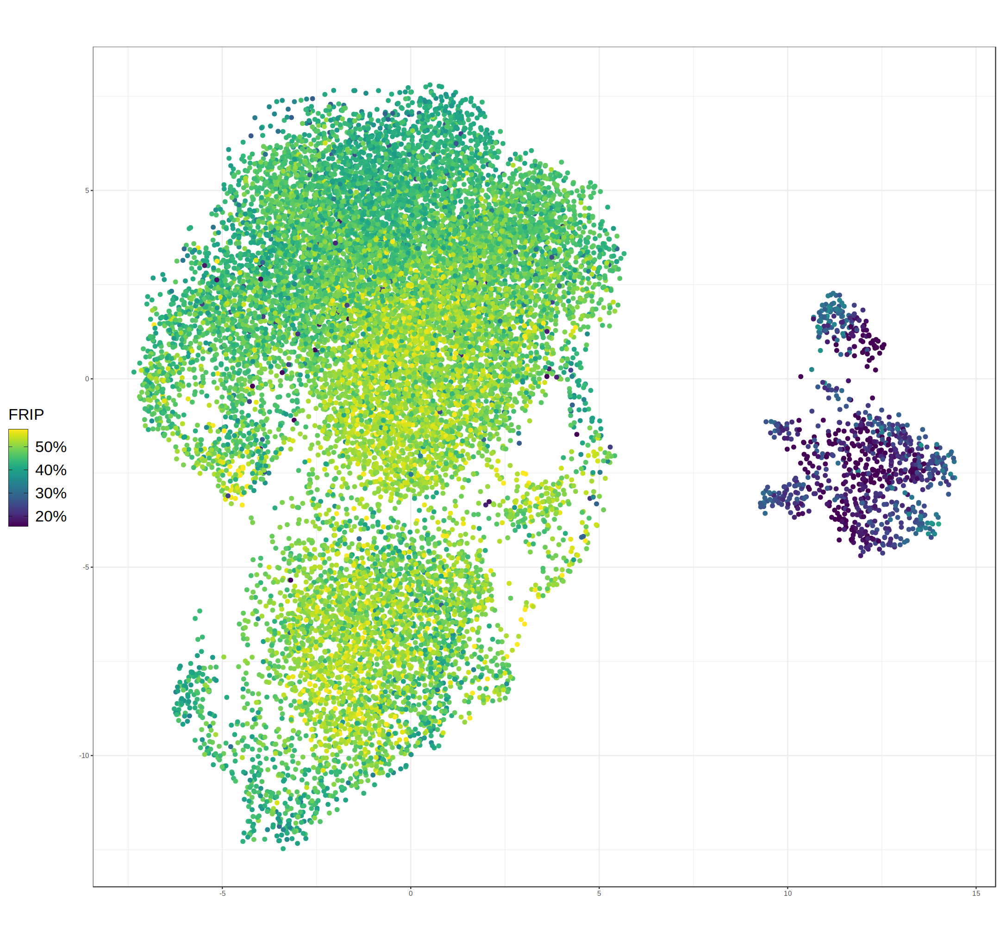

In [24]:
plot_frip <- p3$data %>%
  ggplot(aes(x, y, color = color)) +
  geom_point(size = 2) +
  scale_color_viridis(
    guide = guide_colorbar(frame.colour = 'black', ticks.colour = 'black', show.limits = TRUE),
    labels = scales::percent,
  ) +
  theme_bw() +
  labs(color = 'FRIP') +
  theme(legend.position = 'left',
        axis.title.x = element_blank(),
        axis.title.y = element_blank(),
        legend.title = element_text(size = 20),
        legend.text = element_text(size = 20),
        legend.key.size = unit(0.35, "inches")) +
  coord_fixed()

plot_frip

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-837971db68d3-Date-2024-07-03_Time-14-13-12.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-837971db68d3-Date-2024-07-03_Time-14-13-12.log



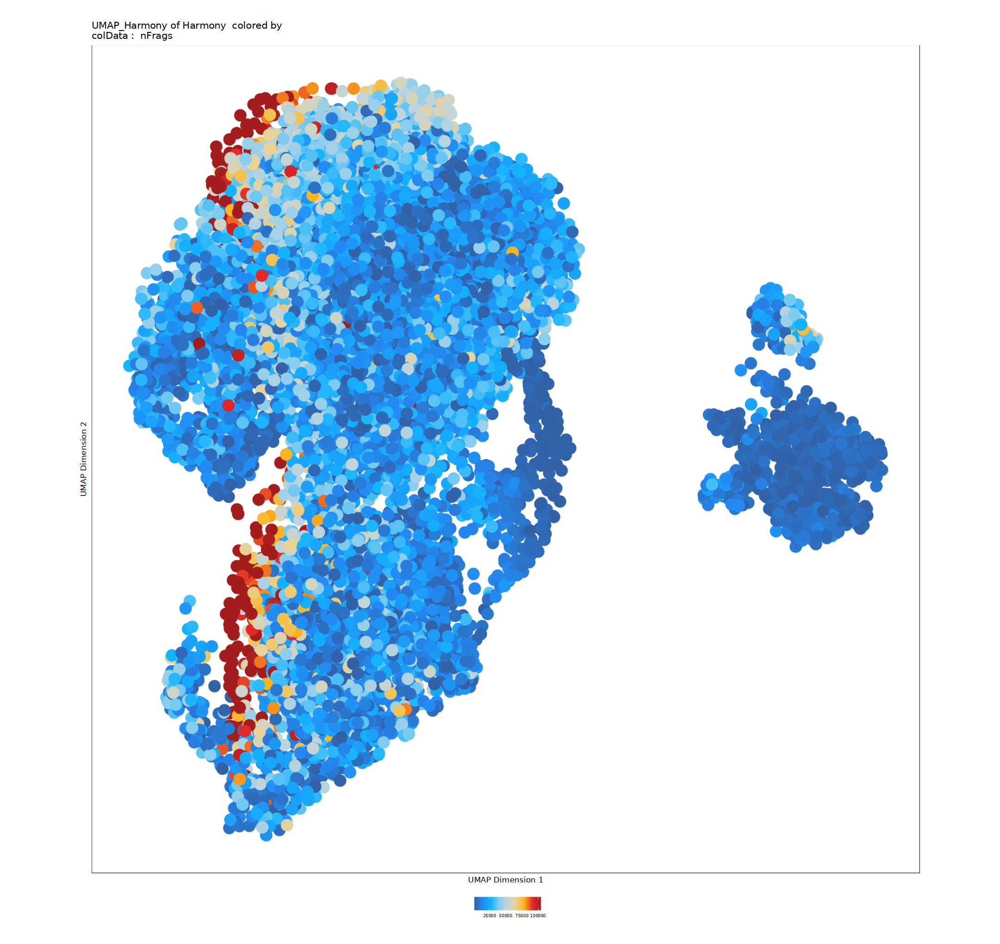

In [25]:
p4 <- plotEmbedding(archrproj, name = "nFrags", embedding = "UMAP_Harmony", size = 2.5, labelAsFactors=F, plotAs = "points", labelMeans=F)
p4

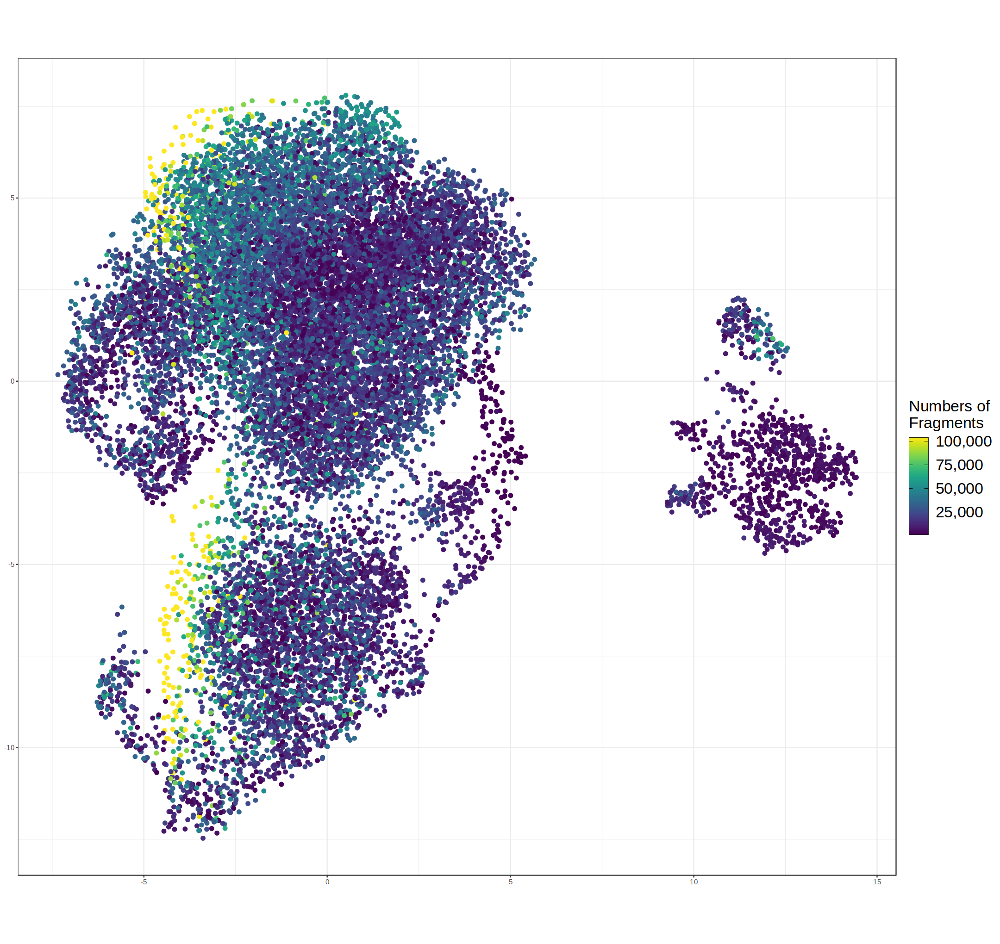

In [26]:
plot_frag <- p4$data %>%
  ggplot(aes(x, y, color = color)) +
  geom_point(size = 2) +
  scale_color_viridis(
    guide = guide_colorbar(frame.colour = 'black', ticks.colour = 'black', show.limits = TRUE),
    labels = scales::comma,
  ) +
  theme_bw() +
  labs(color = 'Numbers of\nFragments') +
  theme(legend.position = 'right',
        axis.title.x = element_blank(),
        axis.title.y = element_blank(),
        legend.title = element_text(size = 20),
        legend.text = element_text(size = 20),
        legend.key.size = unit(0.35, "inches")) +
  coord_fixed()

plot_frag

In [27]:
table_clusters_by_sample <- getCellColData(archrproj_sub) %>%
  as.data.frame() %>%
  group_by(Clusters, Sample) %>%
  summarize(count = n()) %>%
  spread(Sample, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('Clusters', 'total_cell_count', everything()))

knitr::kable(table_clusters_by_sample)

`summarise()` has grouped output by 'Clusters'. You can override using the `.groups` argument.




|Clusters | total_cell_count| J11-1| J11-2| J11-3| J11-4|  J7| J9-1| J9-2|  lw7|  lw9|
|:--------|----------------:|-----:|-----:|-----:|-----:|---:|----:|----:|----:|----:|
|C2       |             3509|     0|     0|     0|     0|   0|    0|    2|  742| 2765|
|C4       |            12787|     7|    20|     3|     6|   1|    9|   11| 5364| 7366|
|C6       |              881|    57|    68|   111|   153| 146|  143|  203|    0|    0|

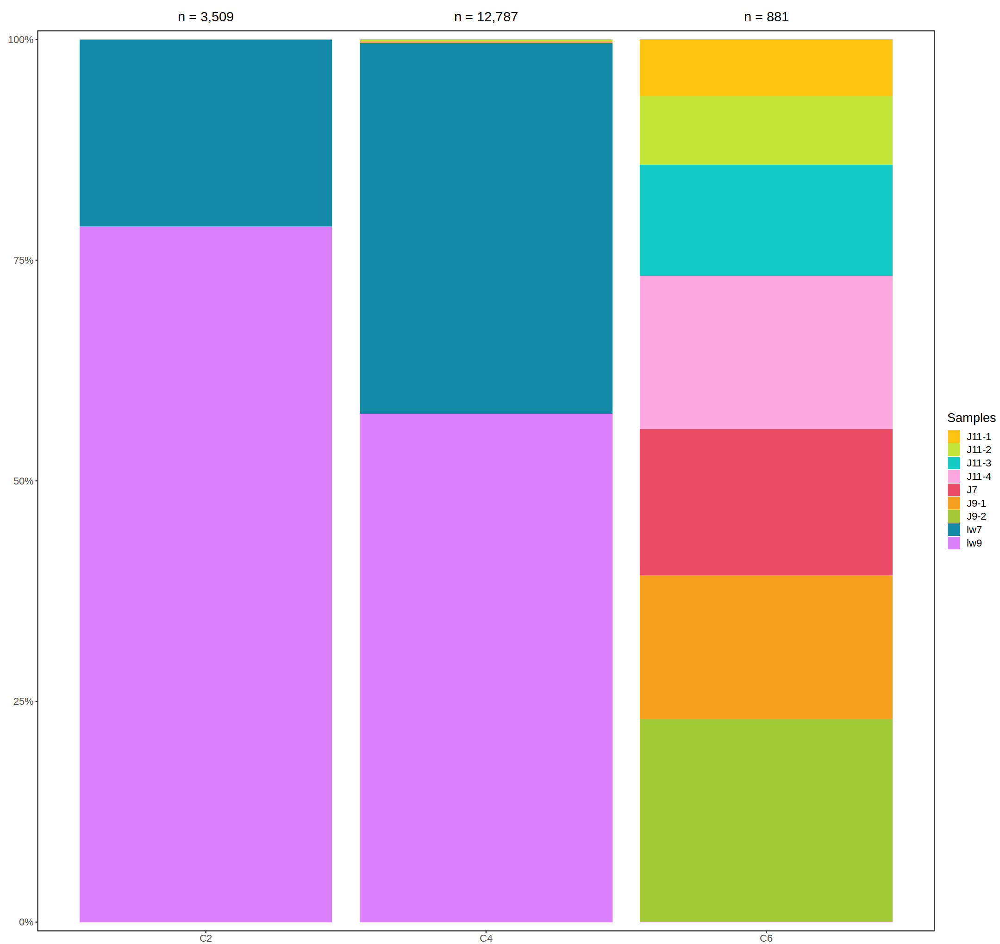

In [28]:
temp_labels <- getCellColData(archrproj_sub) %>%
  as.data.frame() %>%
  group_by(Clusters) %>%
  tally()

barplot_sample <- table_clusters_by_sample %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'Clusters') %>%
  #mutate(Clusters = factor(Clusters, levels = levels(getCellColData(archrproj_sub)$Clusters))) %>%
  ggplot(aes(Clusters, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity') +
  geom_text(
    data = temp_labels,
    aes(x = Clusters, y = Inf, label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)), vjust = -1),
    color = 'black', size = 6
  ) +
  scale_fill_manual(name = 'Samples', values = custom_colors$discrete) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'right',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title = element_blank(),
    plot.margin = margin(t = 40, r = 0, b = 0, l = 10, unit = 'pt')
  )

barplot_sample

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8379471c7f2f-Date-2024-07-03_Time-14-13-18.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8379471c7f2f-Date-2024-07-03_Time-14-13-18.log



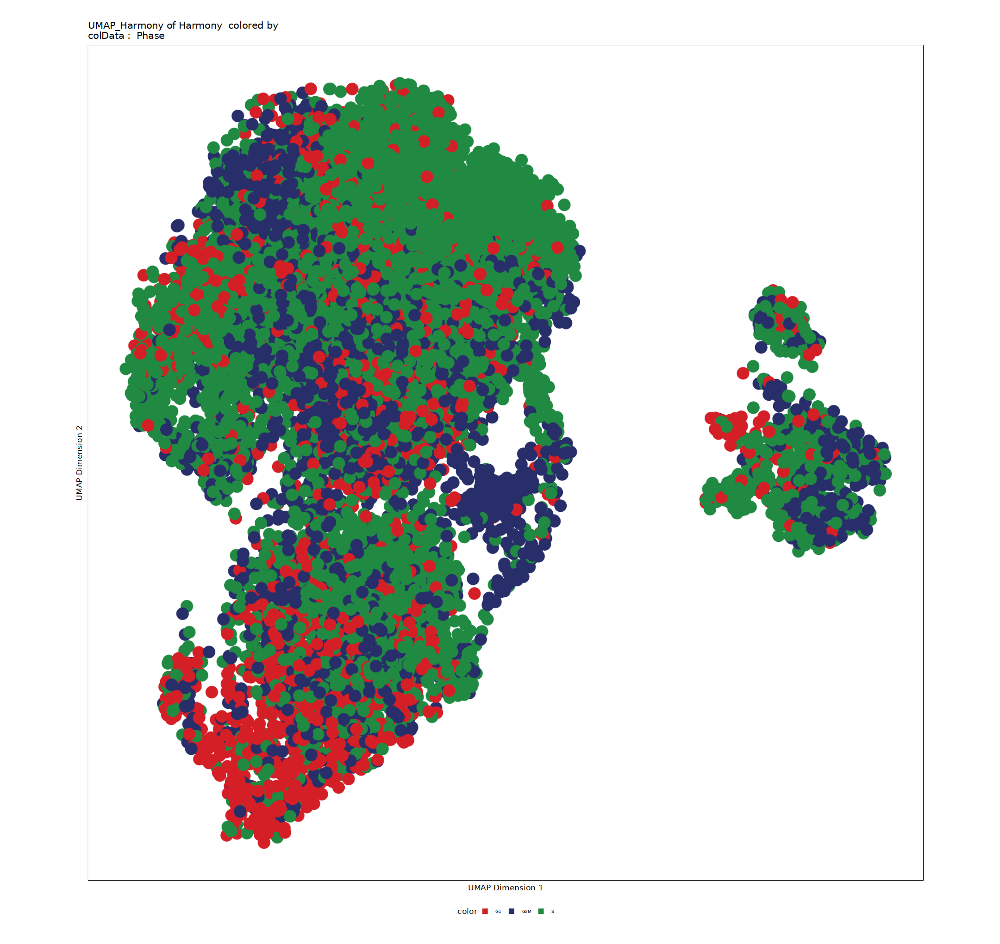

In [29]:
plot_cc <- plotEmbedding(archrproj_sub, name = "Phase", embedding = "UMAP_Harmony", size = 2.5, labelAsFactors=F, plotAs = "points", labelMeans=F)
plot_cc

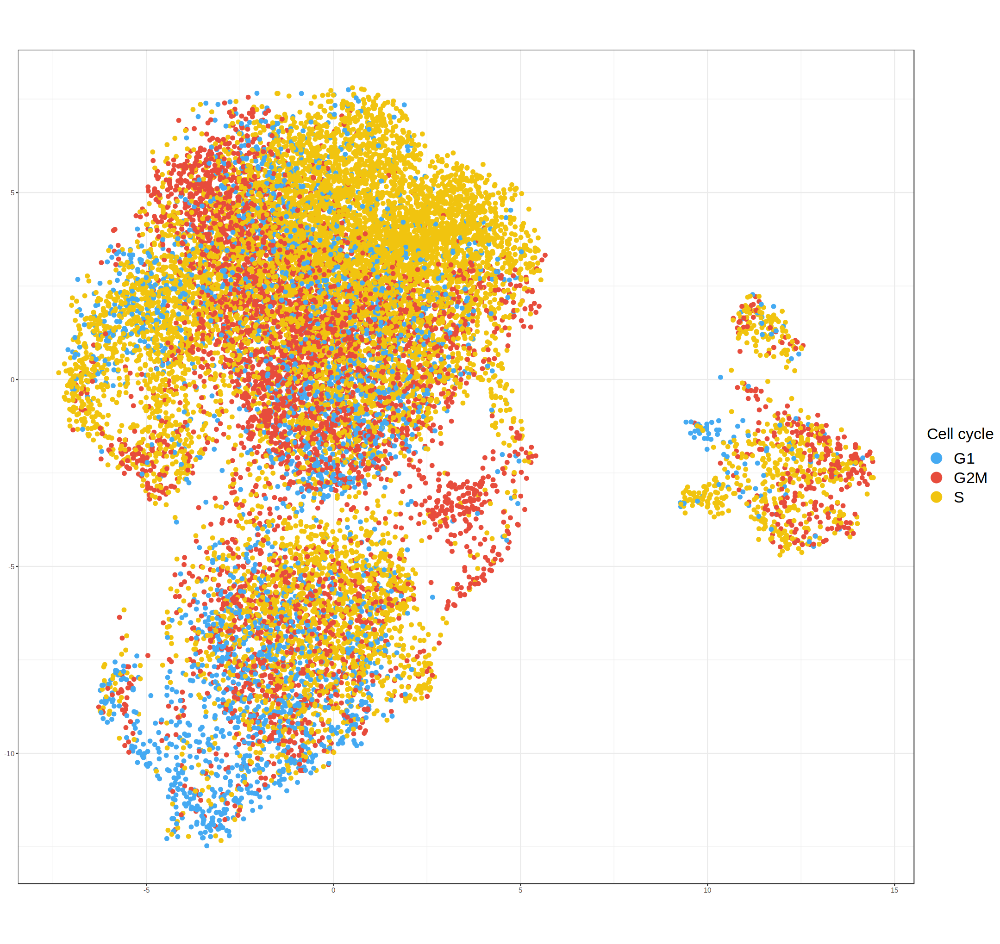

In [30]:
plot_cellcycle <- plot_cc$data %>%
  ggplot(aes(x, y, color = color)) +
  geom_point(size = 2) +
  scale_color_manual(values = custom_colors$cell_cycle,
                    guide = guide_legend(ncol = 1, override.aes = list(size = 6))) +
  theme_bw() +
  labs(color = 'Cell cycle') +
  theme(legend.position = 'right',
        axis.title.x = element_blank(),
        axis.title.y = element_blank(),
        legend.title = element_text(size = 20),
        legend.text = element_text(size = 20),
        legend.key.size = unit(0.35, "inches")) +
  coord_fixed()

plot_cellcycle

In [31]:
plotPeakCallSummary <- function(
	ArchRProj = NULL, 
	pal = NULL
	){

  peakDF <- metadata(ArchRProj@peakSet)$PeakCallSummary

  if(is.null(pal)){
    pal <- paletteDiscrete(values=peakDF$Var1)
  }
  pal <- c("Distal" = "#60BA64", "Exonic" = "#73C6FF", "Intronic" = "#620FA3", "Promoter" = "#FFC554", pal) 
  pal <- pal[!duplicated(names(pal))]

  lengthMax <- split(peakDF$Freq, peakDF$Group) %>% lapply(sum) %>% unlist %>% max

  colnames(peakDF)[colnames(peakDF)=="Var1"] <- "PeakAnno"

  p <- ggplot(peakDF, aes(x=Group, y=Freq, fill=PeakAnno)) + 
    geom_bar(stat = "identity") + 
    theme_bw() +
    ylab(expression(paste("Number of Peaks ", 10^{3}))) +
    xlab("") +
    labs(fill = 'Peak Location') +
    theme(legend.position = "right", 
      legend.key = element_rect(size = 2), 
      legend.box.background = element_rect(color = NA),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 20),
      legend.text = element_text(size = 20),
      legend.title = element_text(size = 20),
      axis.title.y = element_text(size = 20),
      axis.text.y = element_text(size = 20)
    ) +
    scale_fill_manual(values=pal) +
    scale_y_continuous(
      breaks = seq(0, lengthMax * 2,50), 
      limits = c(0, lengthMax * 1.1), 
      expand = c(0,0)
      )

  attr(p, "ratioYX") <- 0.5

  return(p)

}

In [32]:
plot_peak <- plotPeakCallSummary(archrproj_sub)

Warning message:
“The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”


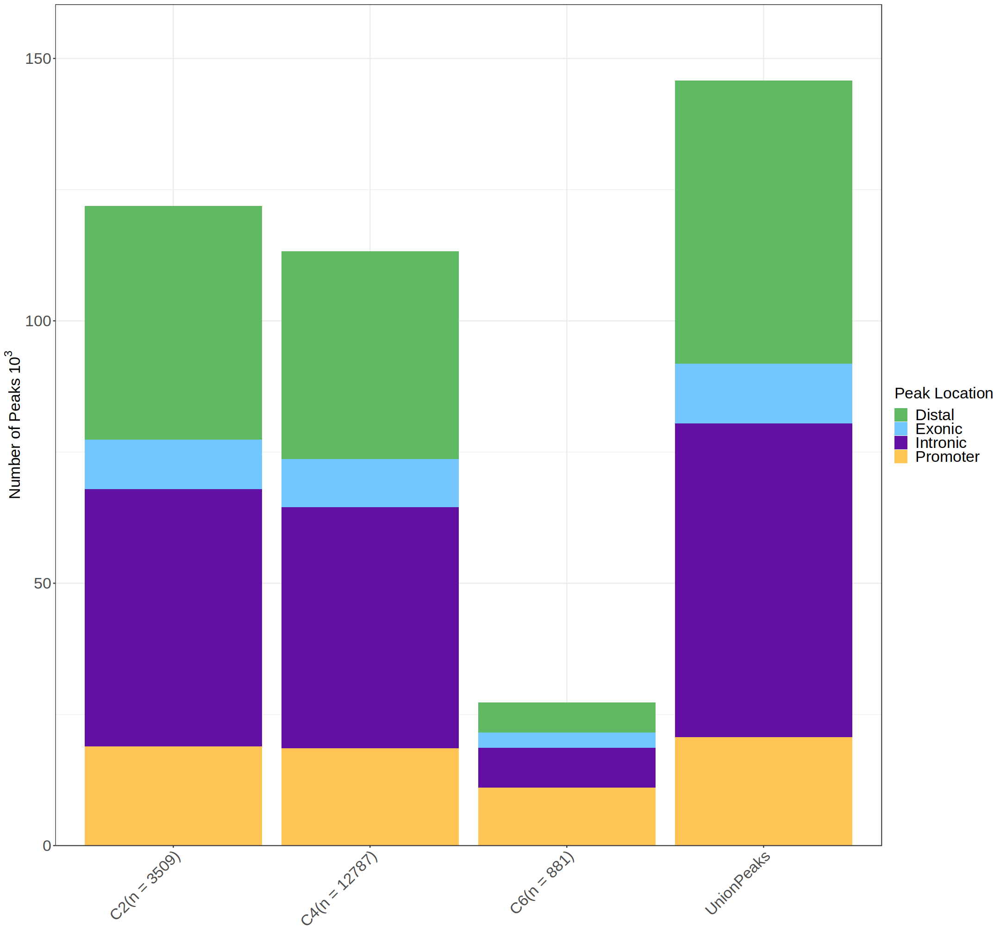

In [33]:
plot_peak

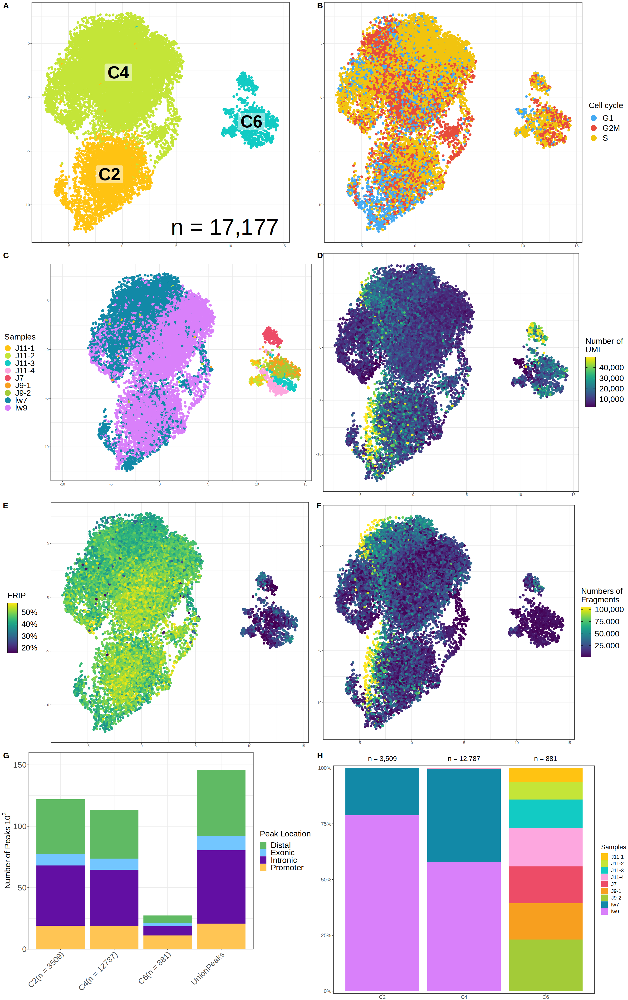

In [34]:
options(repr.plot.width = 22, repr.plot.height = 35, repr.plot.pointsize = 24)
graph_final <- ggdraw() +
  draw_plot(ggplot_cluster, 0, .75, .5, .25) +
  draw_plot(plot_cellcycle, .5, .75, .5, .25) +
  draw_plot(plot_sample, 0, 0.5, .5, .25) +
  draw_plot(plot_umi, .5, 0.5, .5, .25) +
  draw_plot(plot_frip, 0, 0.25, .5, .25) +
  draw_plot(plot_frag, .5, 0.25, .5, .25) +
  draw_plot(plot_peak, 0, 0, .5, .25) +
  draw_plot(barplot_sample, .5, 0, .5, .25) +
  draw_plot_label(c("A", "B", "C", "D", "E", "F", "G", "H"), c(0, 0.5, 0, 0.5, 0, 0.5, 0, 0.5), c(1, 1, 0.75, 0.75, 0.5, 0.5, 0.25, 0.25), size = 20)

graph_final

In [35]:
ggsave("/home/adufour/work/notebook/plots/omics/graphique_supplementary_stemcells.pdf", graph_final, height = 22, width = 22)

In [5]:
table_clusters_by_sample <- getCellColData(archrproj_sub) %>%
  as.data.frame() %>%
  group_by(Sample, Clusters) %>%
  summarize(count = n()) %>%
  spread(Clusters, count, fill = 0) %>%
  ungroup() %>%
  mutate(total_cell_count = rowSums(.[c(2:ncol(.))])) %>%
  dplyr::select(c('Sample', 'total_cell_count', everything()))

knitr::kable(table_clusters_by_sample)

`summarise()` has grouped output by 'Sample'. You can override using the `.groups` argument.




|Sample | total_cell_count|  C1|   C2|   C3|   C4|  C5|  C6|
|:------|----------------:|---:|----:|----:|----:|---:|---:|
|J11-1  |             2801|   0|    0| 2642|    7|  57|  95|
|J11-2  |             3333|   0|    0| 3145|   20|  64| 104|
|J11-3  |             1297|   5|    0| 1082|    3|  95| 112|
|J11-4  |             2990|   2|    0| 2547|    6| 261| 174|
|J7     |              908| 626|    0|   41|    1|  94| 146|
|J9-1   |             1868|   0|    0| 1695|    9|  21| 143|
|J9-2   |             2052|   0|    2| 1772|   11|  40| 227|
|lw7    |             6246|   0|  742|  140| 5364|   0|   0|
|lw9    |            10171|   0| 2765|   40| 7366|   0|   0|

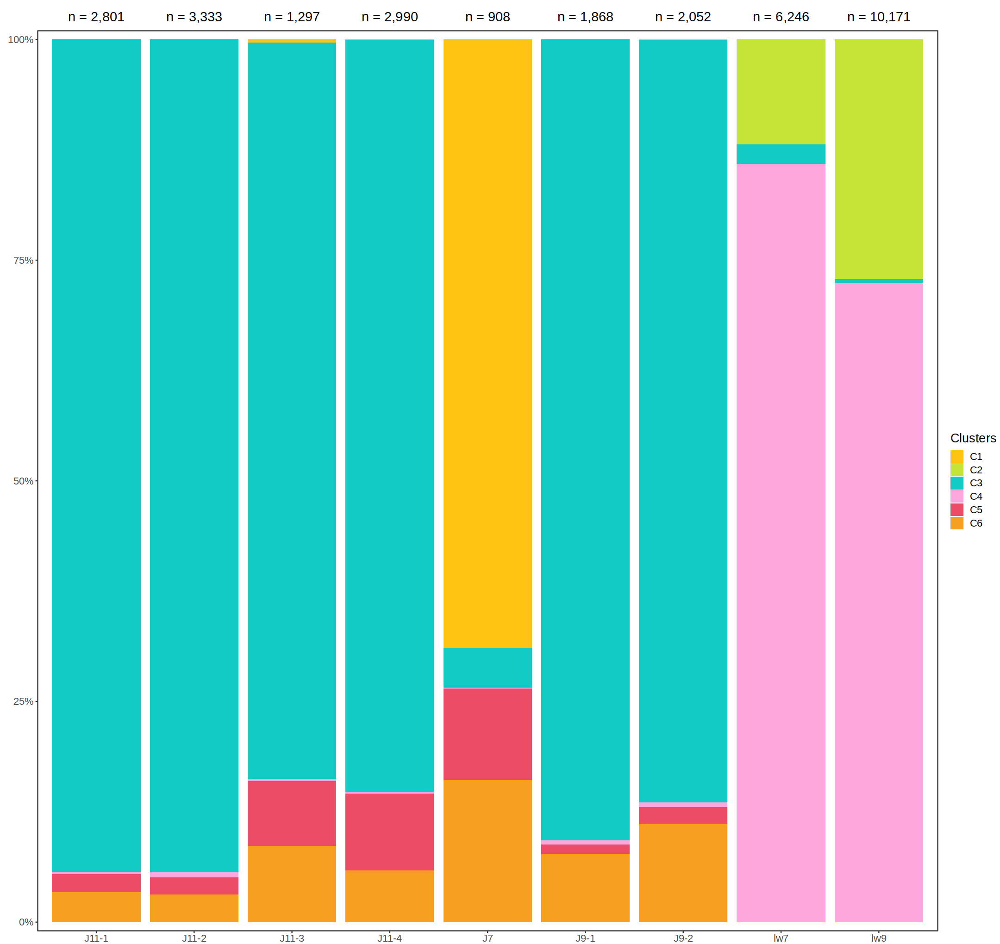

In [6]:
temp_labels <- getCellColData(archrproj_sub) %>%
  as.data.frame() %>%
  group_by(Sample) %>%
  tally()

barplot_sample <- table_clusters_by_sample %>%
  dplyr::select(-c('total_cell_count')) %>%
  reshape2::melt(id.vars = 'Sample') %>%
  #mutate(Clusters = factor(Clusters, levels = levels(getCellColData(archrproj_sub)$Clusters))) %>%
  ggplot(aes(Sample, value)) +
  geom_bar(aes(fill = variable), position = 'fill', stat = 'identity') +
  geom_text(
    data = temp_labels,
    aes(x = Sample, y = Inf, label = paste0('n = ', format(n, big.mark = ',', trim = TRUE)), vjust = -1),
    color = 'black', size = 6
  ) +
  scale_fill_manual(name = 'Clusters', values = custom_colors$discrete) +
  scale_y_continuous(name = 'Percentage [%]', labels = scales::percent_format(), expand = c(0.01,0)) +
  coord_cartesian(clip = 'off') +
  theme_bw() +
  theme(
    legend.position = 'right',
    plot.title = element_text(hjust = 0.5),
    text = element_text(size = 16),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    axis.title = element_blank(),
    plot.margin = margin(t = 40, r = 0, b = 0, l = 10, unit = 'pt')
  )

barplot_sample

In [7]:
ggsave("/home/adufour/work/notebook/plots/omics/barplot_sample.pdf", barplot_sample, height = 22, width = 22)